#Set up to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


# Library

## Install packages

In [ ]:
!pip3 install ipdb
!pip3 install tqdm

     |████████████████████████████████| 788kB 5.6MB/s 
     |████████████████████████████████| 368kB 9.4MB/s 
  Created wheel for ipdb: filename=ipdb-0.13.7-cp37-none-any.whl size=11434 sha256=8d99b467d9f1e4f9e63f8664f15743f318000d3b0049515279df6cd4f12a9705
  Stored in directory: /root/.cache/pip/wheels/69/e2/66/bde554f8029ad1c5288f3bf427a78b18ec670182d7e670efe6
Successfully built ipdb
ERROR: jupyter-console 5.2.0 has requirement prompt-toolkit<2.0.0,>=1.0.0, but you'll have prompt-toolkit 3.0.18 which is incompatible.
ERROR: google-colab 1.0.0 has requirement ipython~=5.5.0, but you'll have ipython 7.22.0 which is incompatible.
  Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0


## Import library

In [ ]:
import ipdb
from __future__ import print_function, division
import torch
import torch.nn as nn
import torch.cuda as cuda
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from os import listdir
import copy
import pdb
from tqdm import tqdm
from pathlib import Path
from torch.utils.data import DataLoader, Dataset

import pandas as pd

%matplotlib inline
from PIL import Image, ImageEnhance
import glob

plt.ion()   # interactive mode

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Assume that we are on a CUDA machine, then this should print a CUDA device:

print(device)

cuda:0


# Xception model

In [ ]:
from __future__ import print_function, division, absolute_import
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo
from torch.nn import init

__all__ = ['xception']

pretrained_settings = {
    'xception': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/xception-43020ad28.pth',
            'input_space': 'RGB',
            'input_size': [3, 299, 299],
            'input_range': [0, 1],
            'mean': [0.5, 0.5, 0.5],
            'std': [0.5, 0.5, 0.5],
            'num_classes': 1000,
            'scale': 0.8975 # The resize parameter of the validation transform should be 333, and make sure to center crop at 299x299
        }
    }
}


class SeparableConv2d(nn.Module):
    def __init__(self,in_channels,out_channels,kernel_size=1,stride=1,padding=0,dilation=1,bias=False):
        super(SeparableConv2d,self).__init__()

        self.conv1 = nn.Conv2d(in_channels,in_channels,kernel_size,stride,padding,dilation,groups=in_channels,bias=bias)
        self.pointwise = nn.Conv2d(in_channels,out_channels,1,1,0,1,1,bias=bias)

    def forward(self,x):
        x = self.conv1(x)
        x = self.pointwise(x)
        return x


class Block(nn.Module):
    def __init__(self,in_filters,out_filters,reps,strides=1,start_with_relu=True,grow_first=True):
        super(Block, self).__init__()

        if out_filters != in_filters or strides!=1:
            self.skip = nn.Conv2d(in_filters,out_filters,1,stride=strides, bias=False)
            self.skipbn = nn.BatchNorm2d(out_filters)
        else:
            self.skip=None

        rep=[]

        filters=in_filters
        if grow_first:
            rep.append(nn.ReLU(inplace=True))
            rep.append(SeparableConv2d(in_filters,out_filters,3,stride=1,padding=1,bias=False))
            rep.append(nn.BatchNorm2d(out_filters))
            filters = out_filters

        for i in range(reps-1):
            rep.append(nn.ReLU(inplace=True))
            rep.append(SeparableConv2d(filters,filters,3,stride=1,padding=1,bias=False))
            rep.append(nn.BatchNorm2d(filters))

        if not grow_first:
            rep.append(nn.ReLU(inplace=True))
            rep.append(SeparableConv2d(in_filters,out_filters,3,stride=1,padding=1,bias=False))
            rep.append(nn.BatchNorm2d(out_filters))

        if not start_with_relu:
            rep = rep[1:]
        else:
            rep[0] = nn.ReLU(inplace=False)

        if strides != 1:
            rep.append(nn.MaxPool2d(3,strides,1))
        self.rep = nn.Sequential(*rep)

    def forward(self,inp):
        x = self.rep(inp)

        if self.skip is not None:
            skip = self.skip(inp)
            skip = self.skipbn(skip)
        else:
            skip = inp

        x+=skip
        return x


class Xception(nn.Module):
    """
    Xception optimized for the ImageNet dataset, as specified in
    https://arxiv.org/pdf/1610.02357.pdf
    """
    def __init__(self, num_classes=1000):
        """ Constructor
        Args:
            num_classes: number of classes
        """
        super(Xception, self).__init__()
        self.num_classes = num_classes

        self.conv1 = nn.Conv2d(3, 32, 3,2, 0, bias=False)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu1 = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(32,64,3,bias=False)
        self.bn2 = nn.BatchNorm2d(64)
        self.relu2 = nn.ReLU(inplace=True)
        #do relu here

        self.block1=Block(64,128,2,2,start_with_relu=False,grow_first=True)
        self.block2=Block(128,256,2,2,start_with_relu=True,grow_first=True)
        self.block3=Block(256,728,2,2,start_with_relu=True,grow_first=True)

        self.block4=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block5=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block6=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block7=Block(728,728,3,1,start_with_relu=True,grow_first=True)

        self.block8=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block9=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block10=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block11=Block(728,728,3,1,start_with_relu=True,grow_first=True)

        self.block12=Block(728,1024,2,2,start_with_relu=True,grow_first=False)

        self.conv3 = SeparableConv2d(1024,1536,3,1,1)
        self.bn3 = nn.BatchNorm2d(1536)
        self.relu3 = nn.ReLU(inplace=True)

        #do relu here
        self.conv4 = SeparableConv2d(1536,2048,3,1,1)
        self.bn4 = nn.BatchNorm2d(2048)

        self.fc = nn.Linear(2048, num_classes)

        # #------- init weights --------
        # for m in self.modules():
        #     if isinstance(m, nn.Conv2d):
        #         n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
        #         m.weight.data.normal_(0, math.sqrt(2. / n))
        #     elif isinstance(m, nn.BatchNorm2d):
        #         m.weight.data.fill_(1)
        #         m.bias.data.zero_()
        # #-----------------------------

    def features(self, input):
        x = self.conv1(input)
        x = self.bn1(x)
        x = self.relu1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)

        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)
        x = self.block6(x)
        x = self.block7(x)
        x = self.block8(x)
        x = self.block9(x)
        x = self.block10(x)
        x = self.block11(x)
        x = self.block12(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu3(x)

        x = self.conv4(x)
        x = self.bn4(x)
        return x

    def logits(self, features):
        x = nn.ReLU(inplace=True)(features)

        x = F.adaptive_avg_pool2d(x, (1, 1))
        x = x.view(x.size(0), -1)
        x = self.last_linear(x)
        return x

    def forward(self, input):
        x = self.features(input)
        x = self.logits(x)
        return x


def xception(num_classes=1000, pretrained='imagenet'):
    model = Xception(num_classes=num_classes)
    if pretrained:
        settings = pretrained_settings['xception'][pretrained]
        assert num_classes == settings['num_classes'], \
            "num_classes should be {}, but is {}".format(settings['num_classes'], num_classes)

        model = Xception(num_classes=num_classes)
        model.load_state_dict(model_zoo.load_url(settings['url']))

        model.input_space = settings['input_space']
        model.input_size = settings['input_size']
        model.input_range = settings['input_range']
        model.mean = settings['mean']
        model.std = settings['std']

    # TODO: ugly
    model.last_linear = model.fc
    del model.fc
    return model

# Import data function

In [ ]:
class Testset(Dataset):

    def __init__(self, csv_file, root_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.data = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.target = np.asarray(self.data.iloc[:, 1], dtype=int)
        self.img_list = self.root_dir+self.data.iloc[:, 2]
        self.transform = transform

    def __len__(self):
        return len(self.data.index)

    def __getitem__(self, index):
        single_img_label = self.target[index]
        single_img_list = self.img_list[index]

        sample = Image.open(single_img_list)

        if self.transform:
            sample = self.transform(sample)

        return sample, single_img_label

# Model Fuction

In [ ]:
def pretrained_model(model_name):
  if model_name == 'resnet50':
    base_model = models.resnet50(pretrained='imagenet')
    n_inputs = base_model.fc.in_features
    
    # Add on classifier
    base_model.fc = nn.Sequential(
        nn.Linear(n_inputs, 512),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(512, 2),
        nn.Softmax(dim=1)
      )
  elif model_name == 'xception':
    base_model = xception(pretrained='imagenet')
    n_inputs = base_model.last_linear.in_features
    
    # Add on classifier
    base_model.last_linear = nn.Sequential(
        nn.Linear(n_inputs, 512),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(512, 2),
        nn.Softmax(dim=1)
      )
    
  return base_model

In [ ]:
def visualize_data(j, pred, lab, prob, images):
  images_so_far = 1
  fig = plt.figure(figsize=(10, 10))
  ax = plt.subplot(6//2,2,images_so_far)
  images_so_far -= 1
  images_so_far += 1
  ax.axis('off')
  ax.set_title('predicted: {} | label: {} | prob: {:.4f}'.format(classes[pred[j]], classes[lab[j]], prob[j][1]))
  imshow(images.cpu().data[j])

In [ ]:
def conf_matrix(preds, labels):
  tp = 0
  tn = 0
  fp = 0
  fn = 0
  
  for pred, label in zip(preds, labels):
    if (label == torch.tensor(1)) and (pred == torch.tensor(1)):
      tp += 1
    elif (label == torch.tensor(1)) and (pred == torch.tensor(0)):
      fp += 1
    elif (label == torch.tensor(0)) and (pred == torch.tensor(0)):
      tn += 1
    elif (label == torch.tensor(0)) and (pred == torch.tensor(1)):
      fn += 1

  return tp, tn, fp, fn

In [ ]:
def metrics(running_loss, running_corrects, dataloaders):
  epoch_loss = running_loss / len(dataloaders.dataset)
  epoch_acc = running_corrects.double() / len(dataloaders.dataset)

  return epoch_loss, epoch_acc

In [ ]:
def show_result(predicted, labels, prob, images):
  r=0
  jal=0
  par=0

  for j in range(images.size()[0]):
    if (prob[j][1] >= torch.tensor([0.5], dtype=torch.float32).to(device)) and (prob[j][1] < torch.tensor([0.6], dtype=torch.float32).to(device)) and (r == 0):
      print('Image uncertain classified to one category')
      visualize_data(j, predicted, labels, prob, images)
      r+=1
    elif (prob[j][1] < torch.tensor([0.5], dtype=torch.float32).to(device)) and (jal == 0):
      print('Image classified as Road category')
      visualize_data(j, predicted, labels, prob, images)
      jal +=1
    elif (prob[j][1] >= torch.tensor([0.6], dtype=torch.float32).to(device)) and (par == 0):
      print('Image classified as Illegal Parking category')
      visualize_data(j, predicted, labels, prob, images)
      par +=1

In [ ]:
def evaluate_data(model, dataloaders):
  pred=[]
  classes=[]
  losses=0
  accs=0
  with torch.no_grad():
    for data in dataloaders:
      images, labels = data
      images = images.to(device)
      labels = labels.to(device)

      outputs = model(images)
      loss = criterion(outputs, labels)

      _, predicted = torch.max(outputs, 1)
      prob = outputs

      for val in prob:
        pred.append(val[1].cpu().numpy().item())
      
      for c in labels:
        classes.append(c.cpu().numpy().item())

      losses += loss.item() * images.size(0)
      accs += torch.sum(predicted == labels.data)

      show_result(predicted, labels, prob, images)

  loss_,acc= metrics(losses, accs, dataloaders)
  conv_mat = conf_matrix(pred, classes)
  print(pred)

  return loss_, acc, pred, classes, conv_mat

# Data Preparation

In [ ]:
test_root= '../content/gdrive/MyDrive/Dataset/Jaki/test/'
test_csv = '../content/gdrive/MyDrive/Dataset/Jaki/test.csv'

In [ ]:
def imshow(img):
    img = img  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

## Resnet

In [ ]:
transform_resnet = transforms.Compose([
                                transforms.Resize((224, 224)),
                                transforms.ToTensor()
                                ])

In [ ]:
jaki_resnet = Testset(test_csv, test_root, transform=transform_resnet)

In [ ]:
dataloaders_resnet = DataLoader(jaki_resnet, batch_size=24, shuffle=True)

In [ ]:
testiter_resnet = iter(dataloaders_resnet)
features_resnet, labels_resnet = next(testiter_resnet)
features_resnet.shape, labels_resnet.shape

(torch.Size([24, 3, 224, 224]), torch.Size([24]))

In [ ]:
classes = ('Jalan','Parkir Liar')

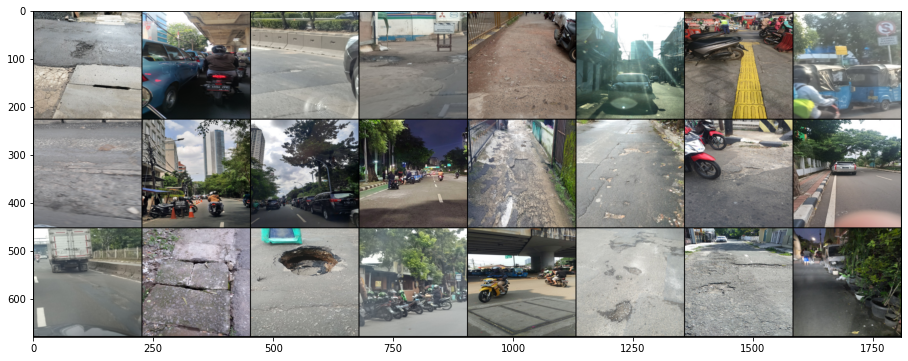

In [ ]:
plt.figure(figsize=(16,6))
imshow(torchvision.utils.make_grid(features_resnet))
print('GroundTruth: ', ' '.join('%5s' % classes[labels_resnet[j]] for j in range(24)))

## Xception

In [ ]:
transform_xc = transforms.Compose([
                                transforms.Resize((299, 299)),
                                transforms.ToTensor()
                                ])

GroundTruth:  Jalan Parkir Liar Jalan Jalan Jalan Parkir Liar Parkir Liar Parkir Liar Jalan Parkir Liar Parkir Liar Parkir Liar Jalan Jalan Jalan Parkir Liar Jalan Jalan Jalan Parkir Liar Parkir Liar Jalan Jalan Parkir Liar


In [ ]:
jaki_xc = Testset(test_csv, test_root, transform=transform_xc)

In [ ]:
dataloaders_xc = DataLoader(jaki_xc, batch_size=24, shuffle=True)

In [ ]:
testiter_xc = iter(dataloaders_xc)
features_xc, labels_xc = next(testiter_xc)
features_xc.shape, labels_xc.shape

(torch.Size([24, 3, 299, 299]), torch.Size([24]))

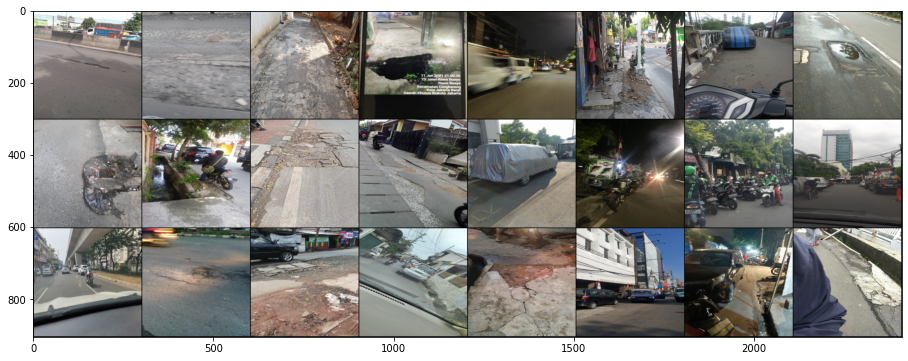

GroundTruth:  Jalan Jalan Jalan Jalan Parkir Liar Jalan Parkir Liar Jalan Jalan Parkir Liar Jalan Jalan Parkir Liar Parkir Liar Parkir Liar Parkir Liar Jalan Jalan Jalan Parkir Liar Jalan Parkir Liar Parkir Liar Jalan


In [ ]:
plt.figure(figsize=(16,6))
imshow(torchvision.utils.make_grid(features_xc))
print('GroundTruth: ', ' '.join('%5s' % classes[labels_xc[j]] for j in range(24)))

# Evaluation

## Resnet

In [ ]:
model_1 = pretrained_model('resnet50').to(device)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


In [ ]:
model_1.load_state_dict(torch.load('/content/gdrive/MyDrive/Model/model_resnet_sgd_sch.pt'))

<All keys matched successfully>

In [ ]:
criterion = nn.CrossEntropyLoss()

Image classified as Illegal Parking category


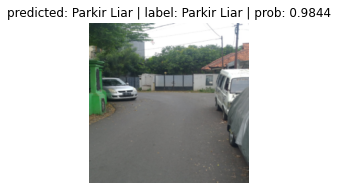

Image classified as Road category


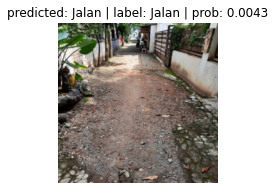

Image classified as Road category


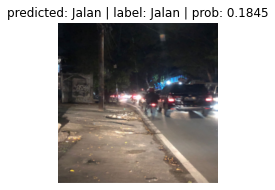

Image classified as Illegal Parking category


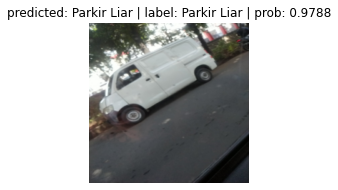

Image classified as Road category


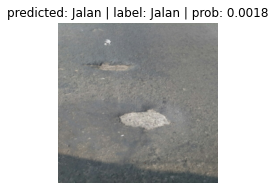

Image classified as Illegal Parking category


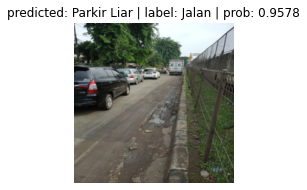

Image classified as Illegal Parking category


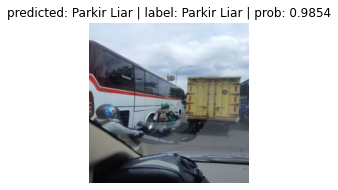

Image classified as Road category


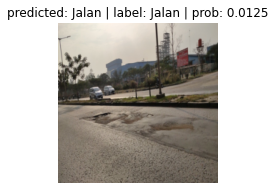

Image uncertain classified to one category


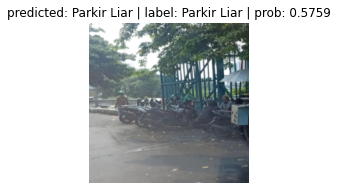

Image classified as Illegal Parking category


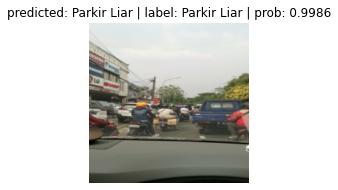

Image classified as Road category


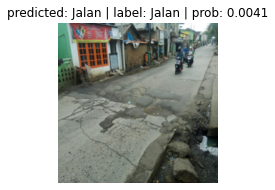

Image classified as Illegal Parking category


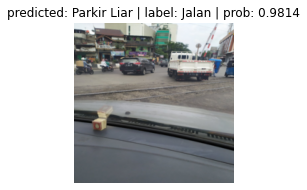

Image classified as Road category


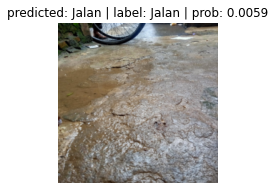

Image classified as Road category


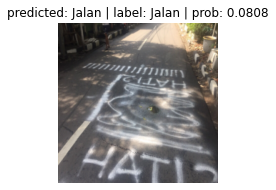

Image classified as Illegal Parking category


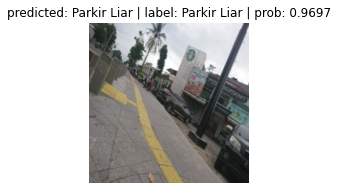

Image classified as Road category


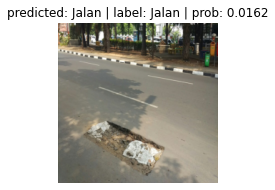

Image classified as Illegal Parking category


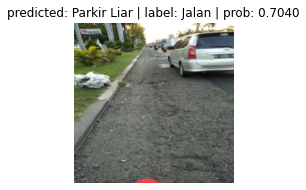

Image classified as Illegal Parking category


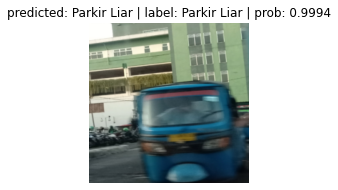

Image classified as Road category


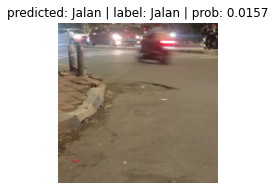

Image uncertain classified to one category


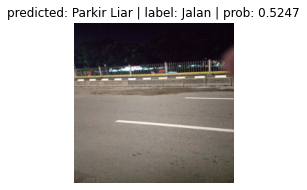

Image classified as Illegal Parking category


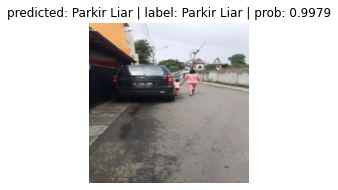

Image classified as Road category


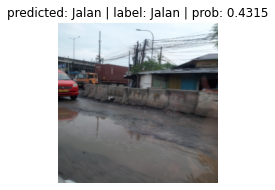

Image classified as Road category


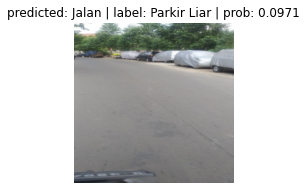

Image classified as Illegal Parking category


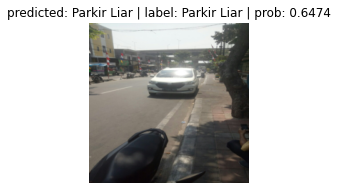

Image uncertain classified to one category


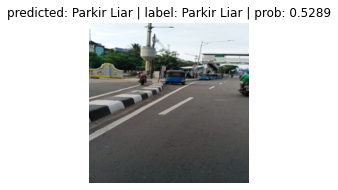

Image classified as Illegal Parking category


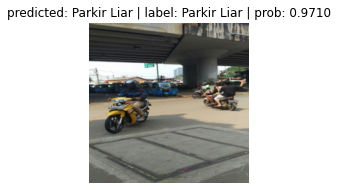

Image classified as Road category


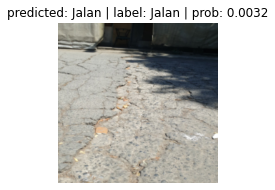

Image classified as Road category


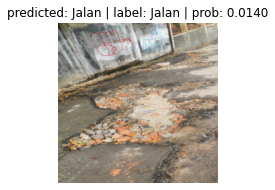

Image classified as Illegal Parking category


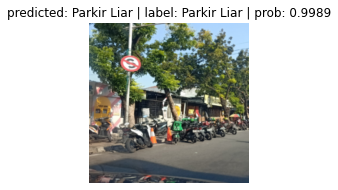

Image classified as Road category


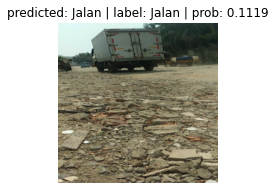

Image uncertain classified to one category


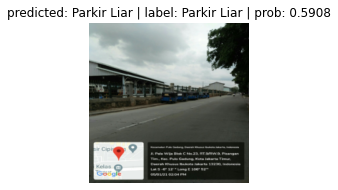

Image classified as Illegal Parking category


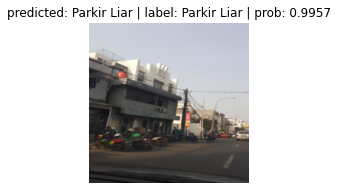

Image classified as Road category


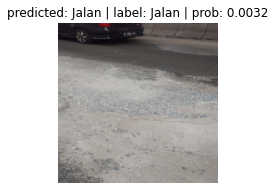

Image classified as Illegal Parking category


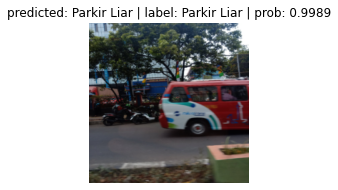

Image uncertain classified to one category


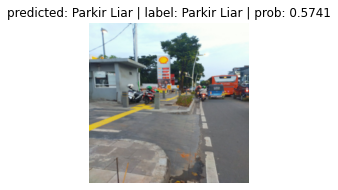

Image classified as Illegal Parking category


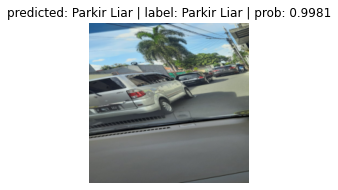

Image classified as Road category


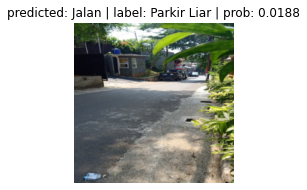

Image classified as Illegal Parking category


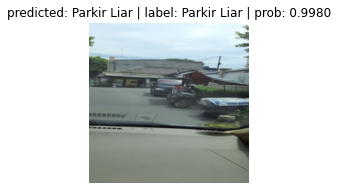

Image classified as Road category


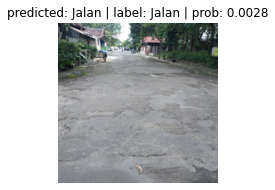

Image classified as Illegal Parking category


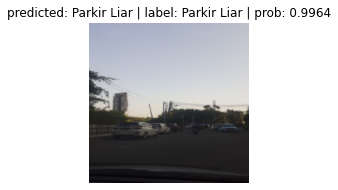

Image classified as Road category


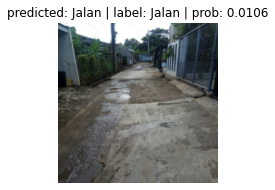

Image classified as Illegal Parking category


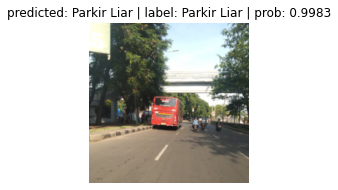

Image classified as Road category


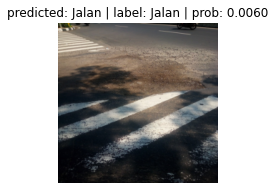

Image uncertain classified to one category


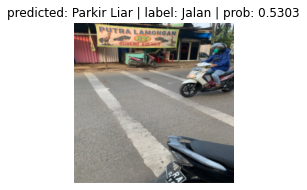

Image classified as Illegal Parking category


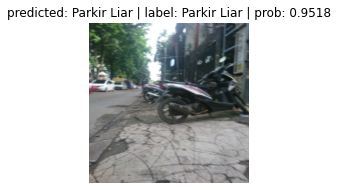

Image classified as Road category


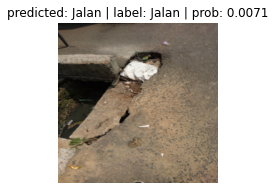

Image uncertain classified to one category


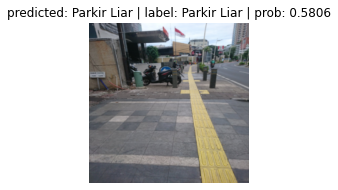

Image classified as Illegal Parking category


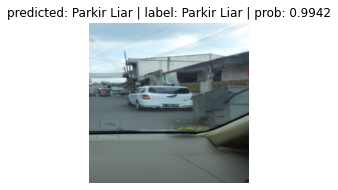

Image classified as Road category


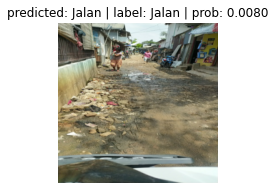

Image classified as Illegal Parking category


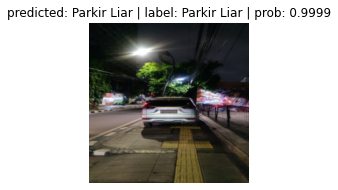

Image classified as Road category


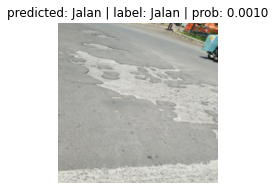

Image uncertain classified to one category


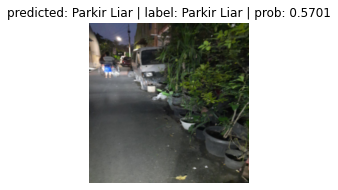

Image classified as Illegal Parking category


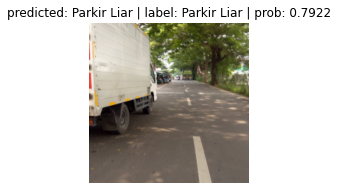

Image classified as Road category


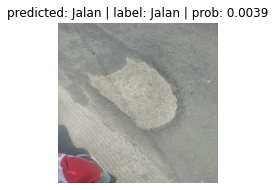

Image classified as Illegal Parking category


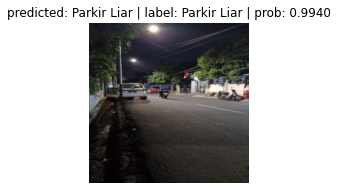

Image classified as Road category


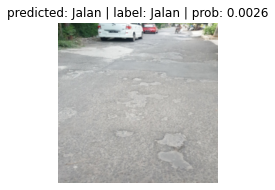

Image classified as Illegal Parking category


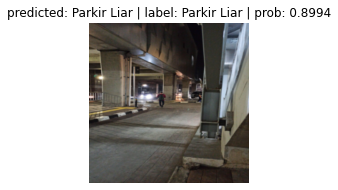

Image classified as Road category


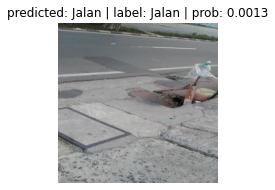

Image classified as Road category


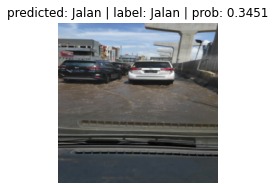

Image classified as Illegal Parking category


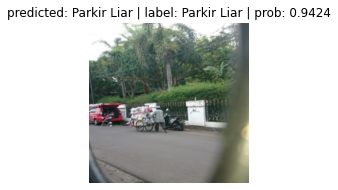

Image classified as Illegal Parking category


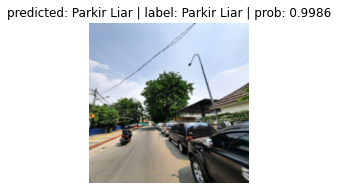

Image classified as Road category


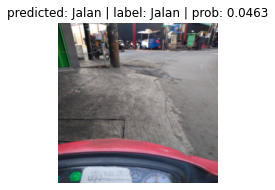

Image classified as Illegal Parking category


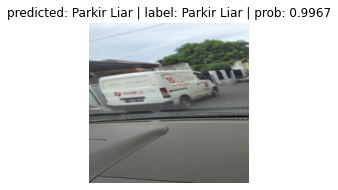

Image classified as Road category


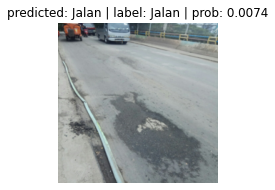

Image classified as Illegal Parking category


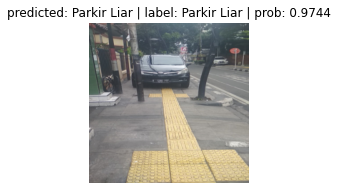

Image classified as Road category


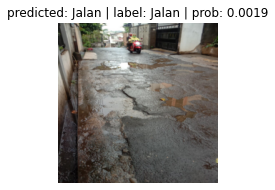

Image uncertain classified to one category


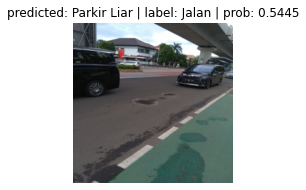

Image classified as Illegal Parking category


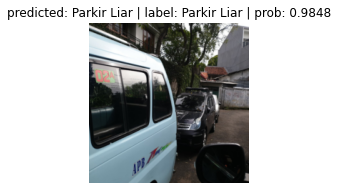

Image classified as Road category


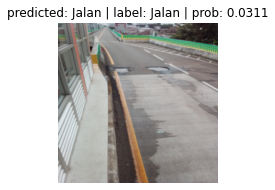

Image classified as Illegal Parking category


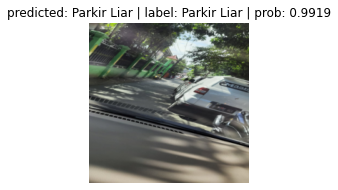

Image classified as Road category


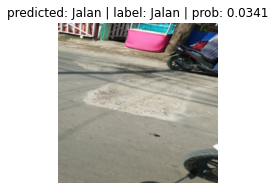

Image classified as Illegal Parking category


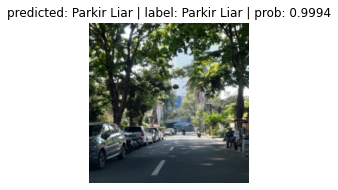

Image classified as Road category


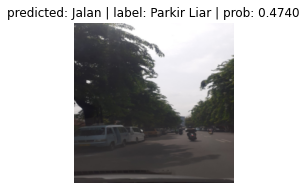

Image classified as Illegal Parking category


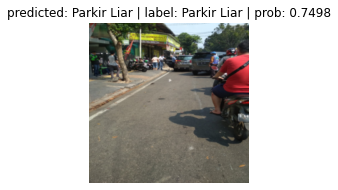

Image classified as Road category


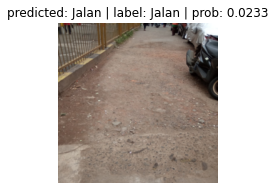

Image classified as Illegal Parking category


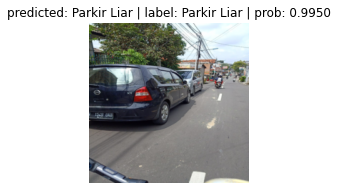

Image classified as Road category


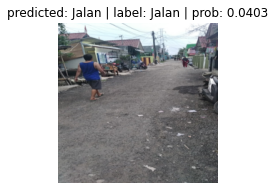

Image classified as Road category


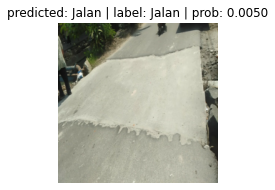

Image classified as Illegal Parking category


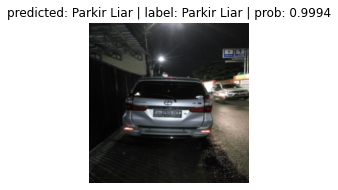

Image classified as Illegal Parking category


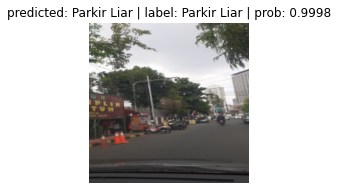

Image classified as Road category


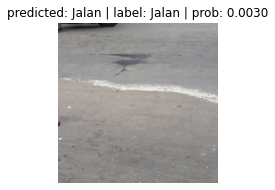

Image classified as Road category


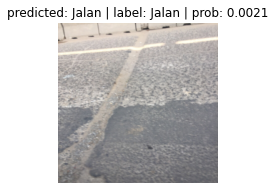

Image classified as Illegal Parking category


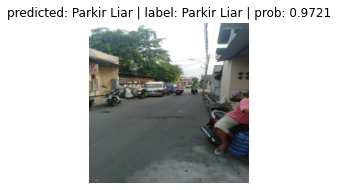

Image classified as Road category


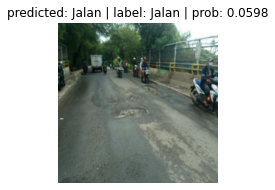

Image classified as Illegal Parking category


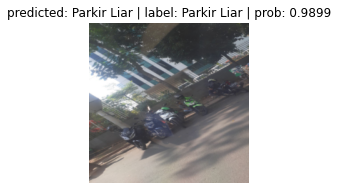

Image uncertain classified to one category


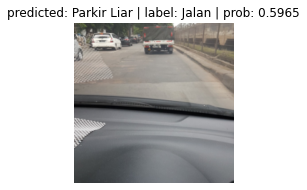

Image classified as Illegal Parking category


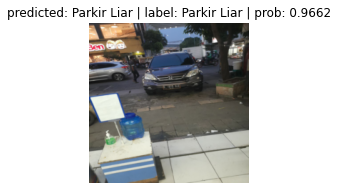

Image uncertain classified to one category


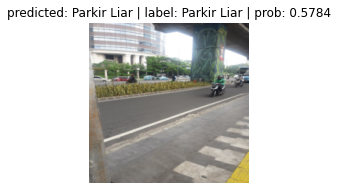

Image classified as Road category


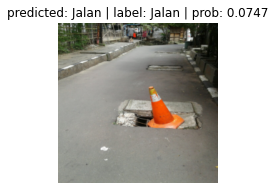

Image classified as Illegal Parking category


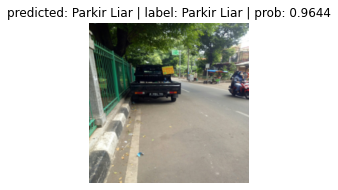

Image classified as Road category


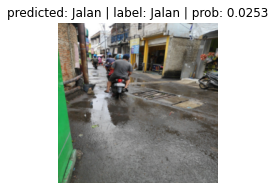

Image classified as Illegal Parking category


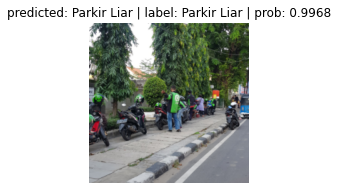

Image classified as Road category


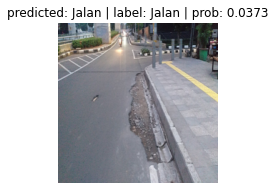

Image uncertain classified to one category


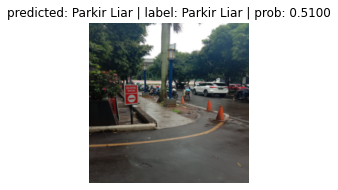

Image classified as Road category


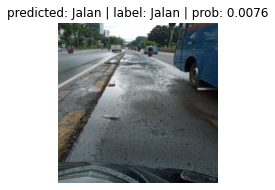

Image classified as Illegal Parking category


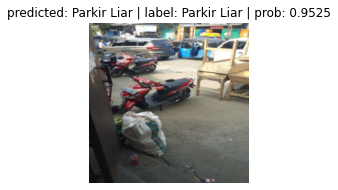

Image classified as Road category


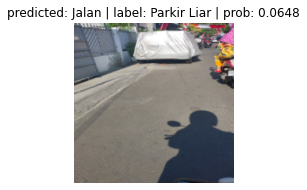

Image classified as Illegal Parking category


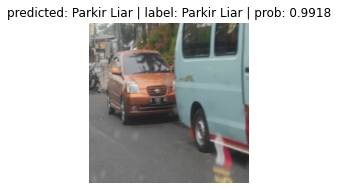

Image classified as Road category


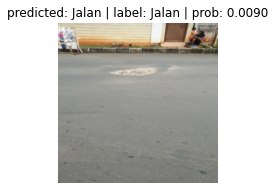

Image classified as Illegal Parking category


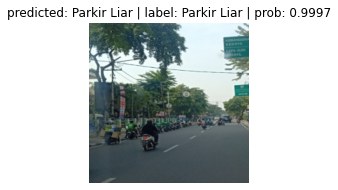

Image classified as Road category


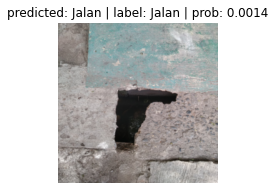

Image classified as Illegal Parking category


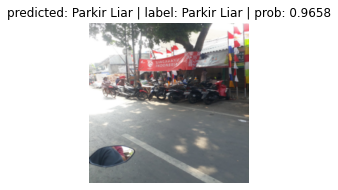

Image classified as Illegal Parking category


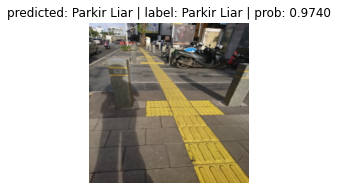

Image classified as Road category


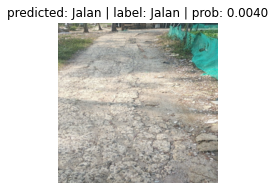

[0.9844255447387695, 0.004256482236087322, 0.04819754883646965, 0.0017352666473016143, 0.012954888865351677, 0.9981831908226013, 0.025172337889671326, 0.9988420605659485, 0.9901324510574341, 0.9998064637184143, 0.03611484542489052, 0.9957318902015686, 0.8458973169326782, 0.9993458390235901, 0.9943374991416931, 0.000847883929964155, 0.48508933186531067, 0.9776385426521301, 0.9975988268852234, 0.7352854013442993, 0.9998562335968018, 0.9297780394554138, 0.0020610825158655643, 0.9981587529182434, 0.1845235824584961, 0.12610077857971191, 0.9788345098495483, 0.995474636554718, 0.9989402890205383, 0.9718157649040222, 0.995441198348999, 0.01074870117008686, 0.9774358868598938, 0.9990578293800354, 0.002706698840484023, 0.017882071435451508, 0.9981635212898254, 0.9071183800697327, 0.004254752770066261, 0.1293228566646576, 0.01785915717482567, 0.9296748042106628, 0.06728674471378326, 0.998219907283783, 0.9911910891532898, 0.9855035543441772, 0.8356373310089111, 0.9955801367759705, 0.0018022251315

In [ ]:
loss_resnet, acc_resnet, y_pred_resnet, y_true_resnet, matrix_resnet = evaluate_data(model_1, dataloaders_resnet)

## Xception

In [ ]:
model_2 = pretrained_model('xception').to(device)

Downloading: "http://data.lip6.fr/cadene/pretrainedmodels/xception-43020ad28.pth" to /root/.cache/torch/hub/checkpoints/xception-43020ad28.pth


In [ ]:
model_2.load_state_dict(torch.load('/content/gdrive/MyDrive/Model/model_xception_sgd.pt'))

<All keys matched successfully>

Image classified as Illegal Parking category


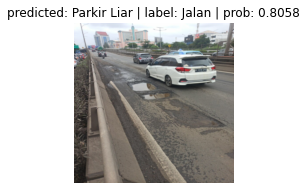

Image classified as Road category


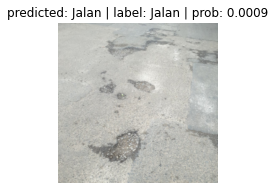

Image classified as Road category


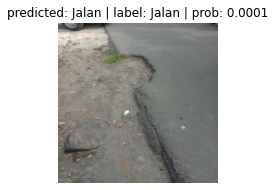

Image classified as Illegal Parking category


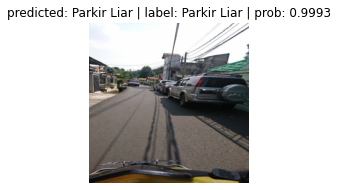

Image uncertain classified to one category


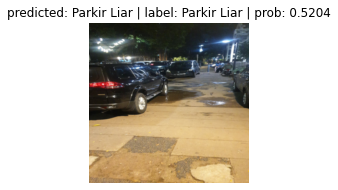

Image classified as Illegal Parking category


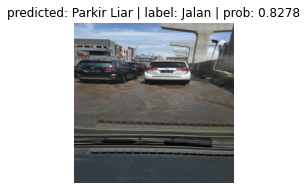

Image classified as Road category


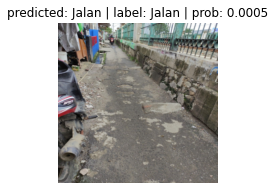

Image classified as Illegal Parking category


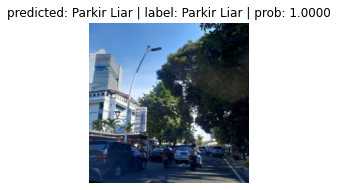

Image classified as Road category


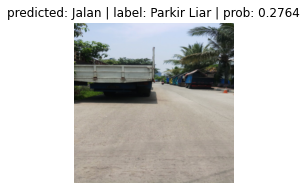

Image classified as Illegal Parking category


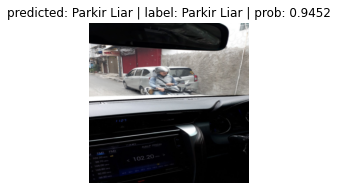

Image classified as Road category


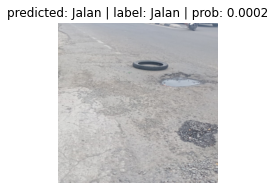

Image classified as Illegal Parking category


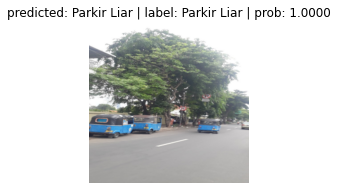

Image classified as Road category


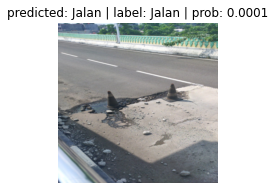

Image classified as Road category


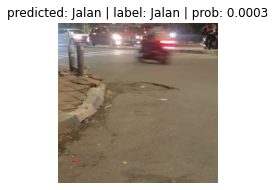

Image classified as Illegal Parking category


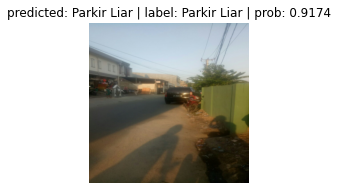

Image uncertain classified to one category


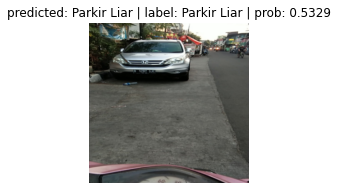

Image classified as Illegal Parking category


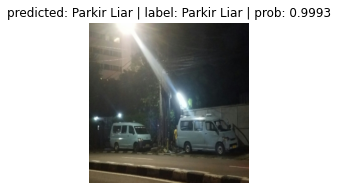

Image classified as Road category


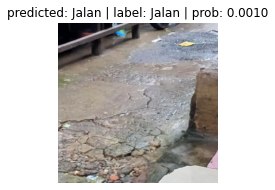

Image classified as Road category


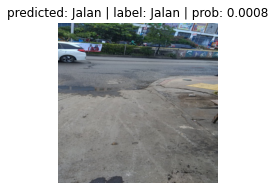

Image classified as Illegal Parking category


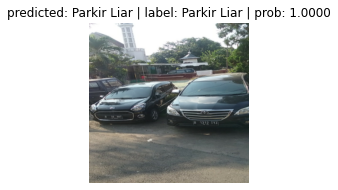

Image classified as Illegal Parking category


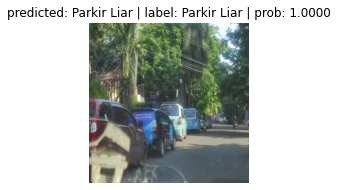

Image classified as Road category


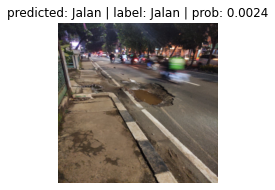

Image classified as Road category


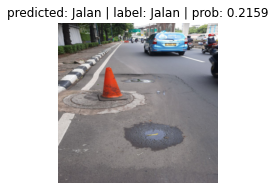

Image classified as Illegal Parking category


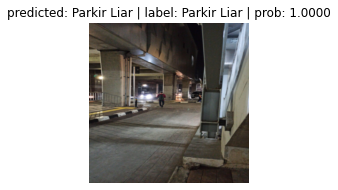

Image classified as Road category


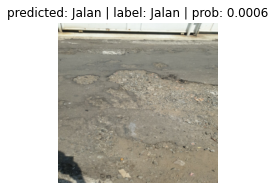

Image classified as Illegal Parking category


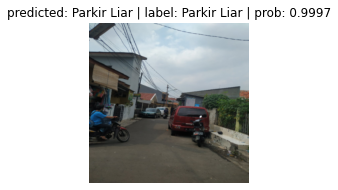

Image classified as Illegal Parking category


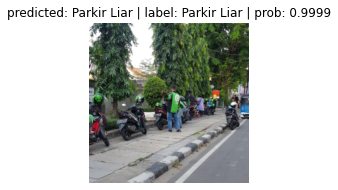

Image classified as Road category


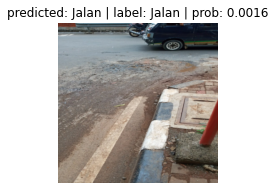

Image classified as Illegal Parking category


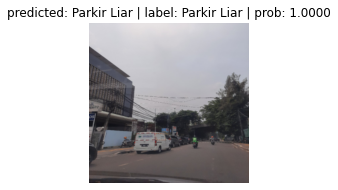

Image classified as Road category


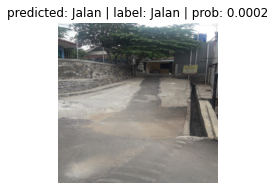

Image classified as Road category


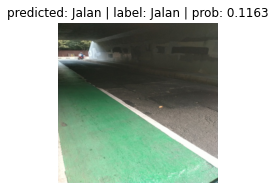

Image classified as Illegal Parking category


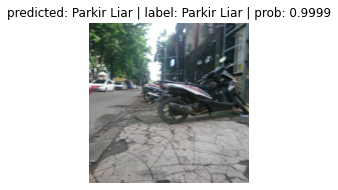

Image classified as Illegal Parking category


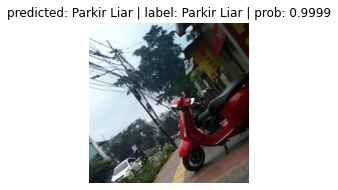

Image classified as Road category


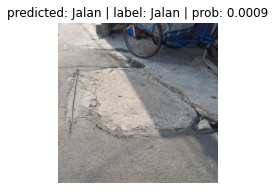

Image uncertain classified to one category


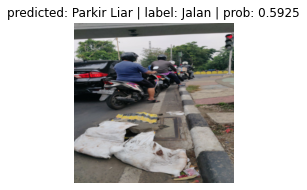

Image classified as Illegal Parking category


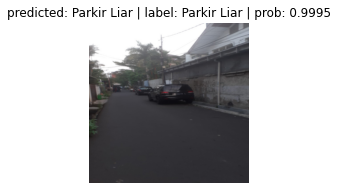

Image classified as Road category


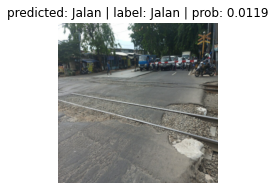

Image classified as Road category


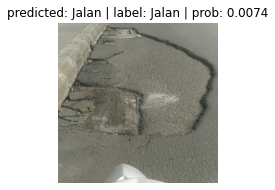

Image classified as Illegal Parking category


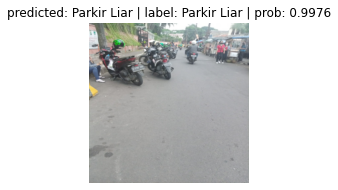

Image classified as Illegal Parking category


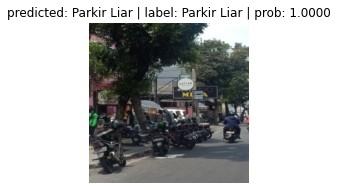

Image classified as Road category


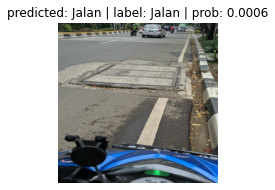

Image classified as Illegal Parking category


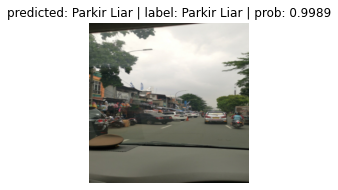

Image classified as Road category


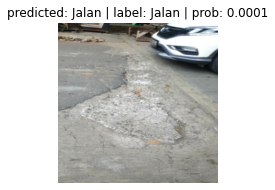

Image classified as Illegal Parking category


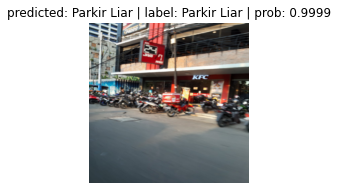

Image classified as Road category


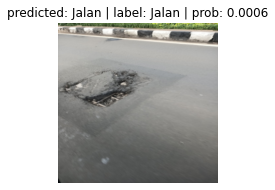

Image classified as Road category


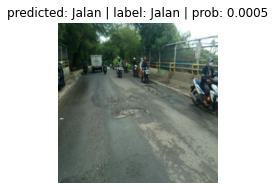

Image classified as Illegal Parking category


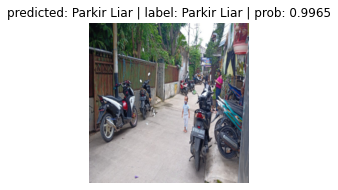

Image classified as Illegal Parking category


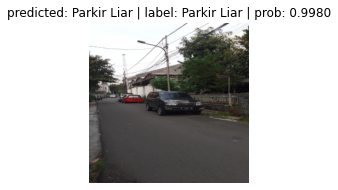

Image classified as Road category


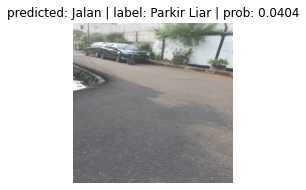

Image uncertain classified to one category


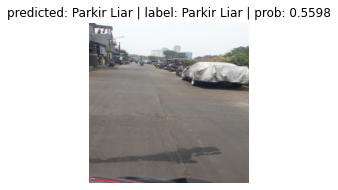

Image classified as Illegal Parking category


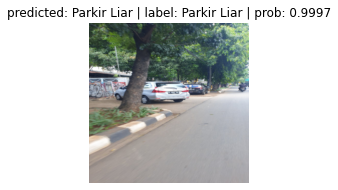

Image classified as Road category


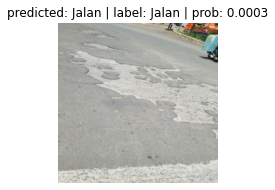

Image classified as Illegal Parking category


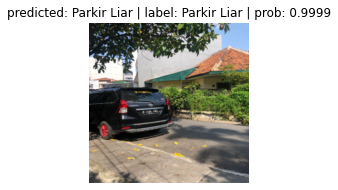

Image classified as Road category


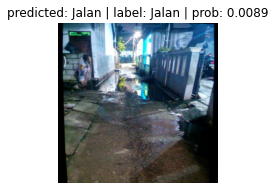

Image classified as Illegal Parking category


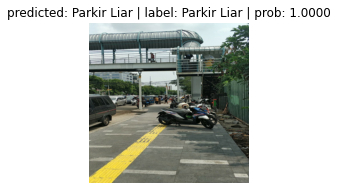

Image classified as Road category


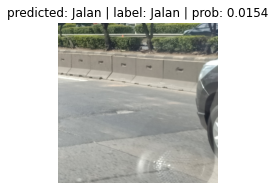

Image uncertain classified to one category


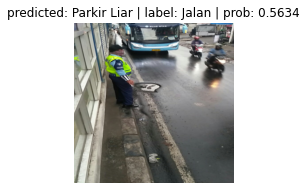

Image classified as Illegal Parking category


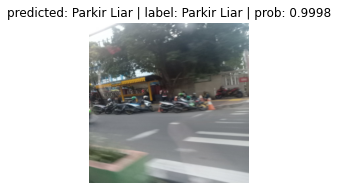

Image classified as Road category


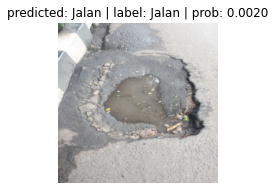

Image classified as Road category


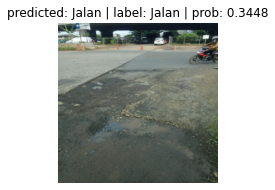

Image classified as Illegal Parking category


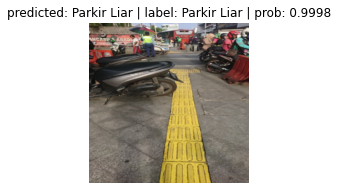

Image uncertain classified to one category


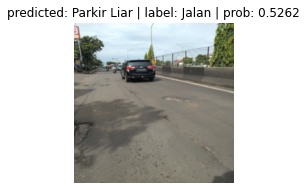

Image classified as Illegal Parking category


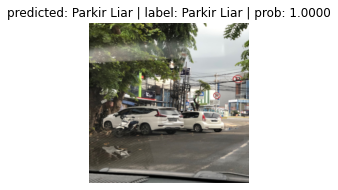

Image classified as Road category


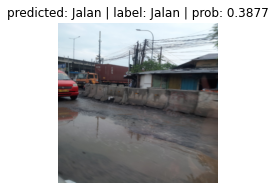

Image uncertain classified to one category


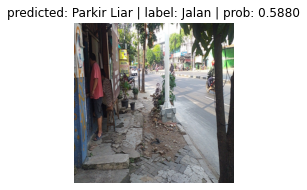

Image classified as Road category


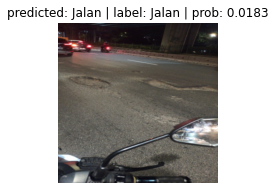

Image classified as Illegal Parking category


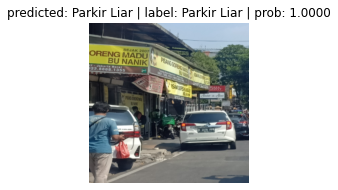

Image classified as Illegal Parking category


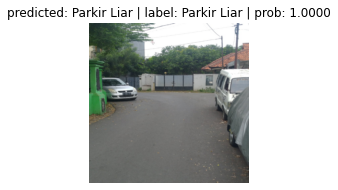

Image classified as Road category


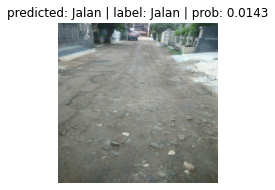

Image classified as Illegal Parking category


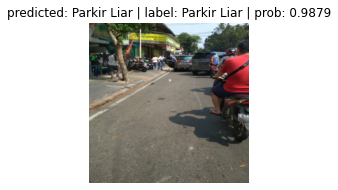

Image classified as Road category


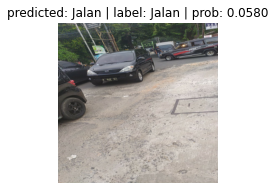

Image classified as Road category


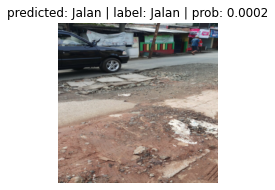

Image classified as Illegal Parking category


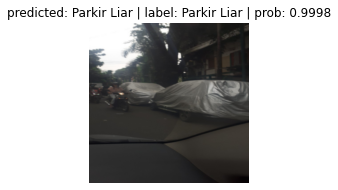

Image uncertain classified to one category


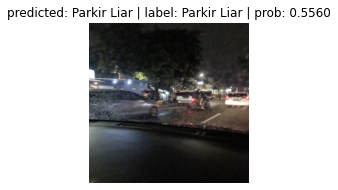

Image classified as Illegal Parking category


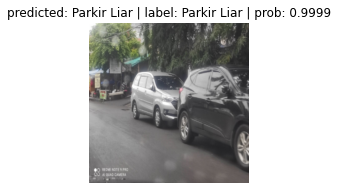

Image classified as Road category


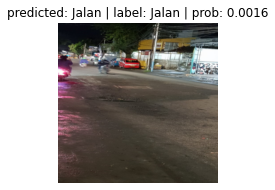

Image classified as Illegal Parking category


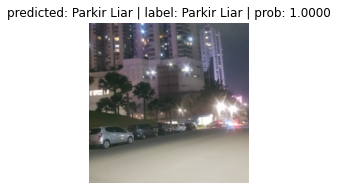

Image classified as Road category


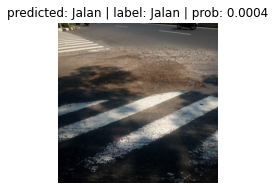

Image classified as Illegal Parking category


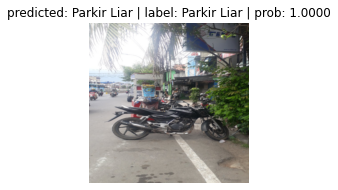

Image classified as Road category


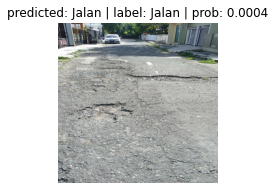

Image classified as Road category


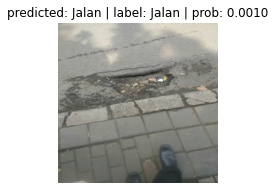

Image classified as Illegal Parking category


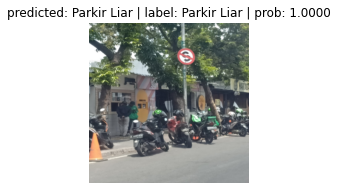

Image classified as Road category


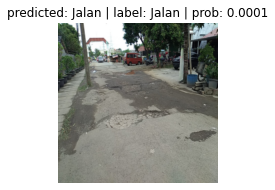

Image classified as Illegal Parking category


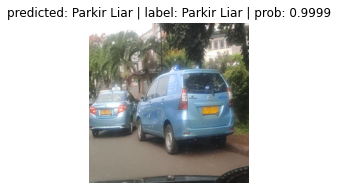

Image classified as Road category


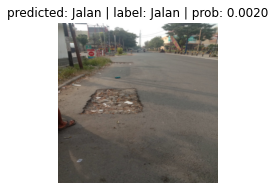

Image classified as Illegal Parking category


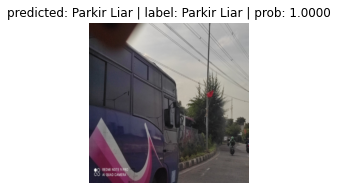

Image classified as Illegal Parking category


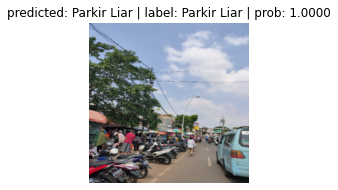

Image classified as Road category


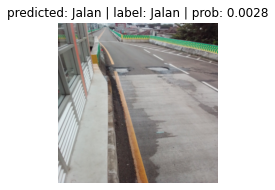

Image classified as Road category


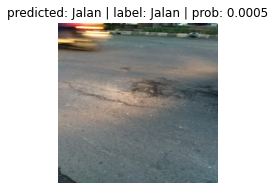

Image classified as Illegal Parking category


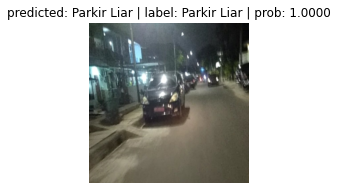

Image classified as Illegal Parking category


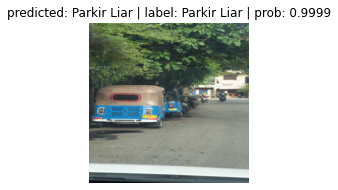

Image classified as Road category


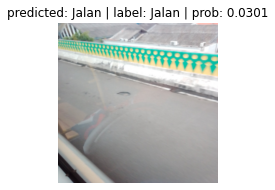

Image classified as Road category


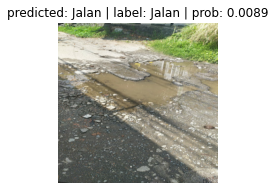

Image classified as Illegal Parking category


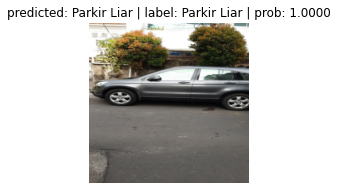

Image uncertain classified to one category


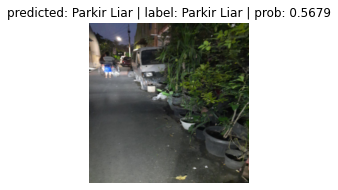

Image classified as Illegal Parking category


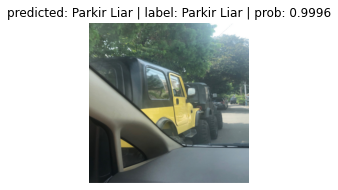

Image uncertain classified to one category


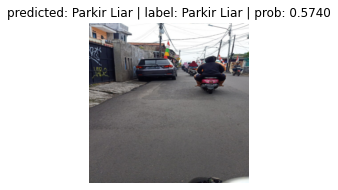

Image classified as Road category


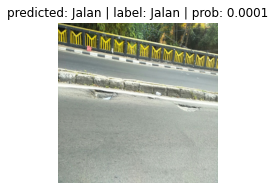

Image classified as Road category


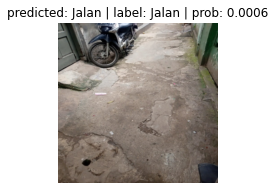

Image classified as Illegal Parking category


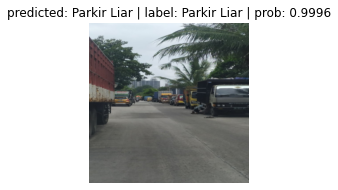

Image classified as Illegal Parking category


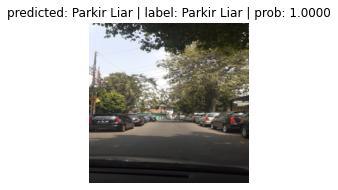

Image classified as Road category


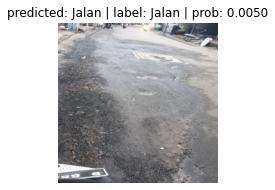

Image uncertain classified to one category


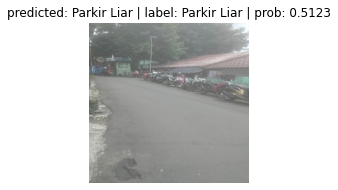

[0.8057522177696228, 0.9989355206489563, 0.9740819931030273, 0.999998927116394, 0.0008675857679918408, 0.9999364614486694, 0.9999921321868896, 0.10395487397909164, 0.0005943475989624858, 0.9999494552612305, 0.9999982118606567, 0.9999492168426514, 0.00035067120916210115, 0.0007173166959546506, 0.9097927808761597, 0.9999978542327881, 0.0012483055470511317, 0.0021458431147038937, 0.8966617584228516, 0.0015425861347466707, 0.9999984502792358, 0.9998301267623901, 0.3120776414871216, 0.0050887176766991615, 0.0001096816486096941, 0.9992870688438416, 0.9999756813049316, 0.5203993320465088, 0.00029661922599188983, 0.9999865293502808, 0.6875315308570862, 0.9999725818634033, 0.9998733997344971, 0.9999722242355347, 0.9997336268424988, 0.42941048741340637, 0.9999881982803345, 0.9332031607627869, 0.999916672706604, 0.9978156089782715, 0.0005141138099133968, 0.22204633057117462, 0.00036700881901197135, 0.0185967106372118, 0.0018750117160379887, 0.04044816270470619, 0.9999969005584717, 0.9999592304229

In [ ]:
loss_xc, acc_xc, y_pred_xc, y_true_xc, matrix_xc = evaluate_data(model_2, dataloaders_xc)

# Eval metrics

In [ ]:
print('Resnet50: Acc: {:.4f} | Loss: {:.4f}'.format(acc_resnet, loss_resnet))
print('Xception: Acc: {:.4f} | Loss: {:.4f}'.format(acc_xc, loss_xc))

Resnet50: Acc: 0.9277 | Loss: 0.3890
Xception: Acc: 0.9304 | Loss: 0.3832


In [ ]:
from sklearn.metrics import precision_recall_curve, accuracy_score
precision_resnet, recall_resnet, thresholds_resnet = precision_recall_curve(y_true_resnet, y_pred_resnet)
precision_xception, recall_xception, thresholds_xception = precision_recall_curve(y_true_xc, y_pred_xc)

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

resnet_auc = roc_auc_score(y_true_resnet, y_pred_resnet)
xception_auc = roc_auc_score(y_true_xc, y_pred_xc)
resnet_fpr, resnet_tpr, _ = roc_curve(y_true_resnet, y_pred_resnet)
xception_fpr, xception_tpr, _ = roc_curve(y_true_xc, y_pred_xc)

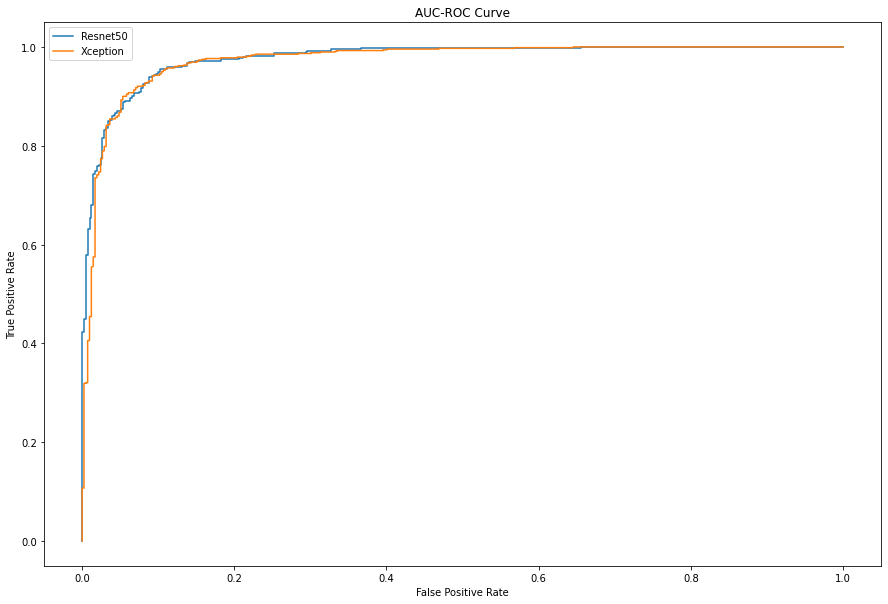

In [ ]:
plt.figure(figsize=(15, 10))
plt.plot(resnet_fpr, resnet_tpr, label ='Resnet50')
plt.plot(xception_fpr, xception_tpr, label ='Xception')
plt.title('AUC-ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()